# Camera calibration implementation


## Ground truth test

In [1]:
import sys
import numpy as np
import cv2 as cv
assert cv.__version__[0] >= '3', 'The fisheye module requires opencv version >= 3.0.0 but version is ' + str(cv.__version__[0])
import matplotlib.pyplot as plt
import glob
import random
import math
print(sys.executable)
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 50

/Users/han-inseong/opt/anaconda3/envs/personal_project/bin/python


In [2]:
class calibration:
    def __init__(self, pattern_size):
        self._pattern_size = pattern_size
        self._criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)
        self._objp = np.zeros((pattern_size[0] * pattern_size[1] ,3), np.float32)
        self._objp[:,:2] = np.mgrid[0:pattern_size[0],0:pattern_size[1]].T.reshape(-1,2)
        self._image_size = ()
        self._images_path = []
        self._used_images = []

    def _random_color__(self):
        rgbl=[255,0,0]
        random.shuffle(rgbl)
        return tuple(rgbl)

    def load_images(self, image_path : str):
        self._images_path = glob.glob(image_path)

    def extract_corners(self, show=True):
        # Arrays to store object points and image points from all the images.
        objpoints = [] # 3d point in real world space
        imgpoints = [] # 2d points in image plane.
        self._used_images = []

        for fname in self._images_path:
            img = cv.imread(fname)

            gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
            self._image_size = gray.shape[::-1]
            # Find the chess board corners
            ret, corners = cv.findChessboardCorners(gray, pattern_size, None)
            # If found, add object points, image points (after refining them)
            if ret == True:
                self._used_images.append(img.copy())
                objpoints.append(self._objp)
                corners2 = cv.cornerSubPix(gray,corners, (11,11), (-1,-1), self._criteria)
                imgpoints.append(corners)

                # Draw and display the corners
                cv.drawChessboardCorners(img, pattern_size, corners2, ret)
                
                if show:
                    # load image using cv2....and do processing.
                    plt.title(fname)
                    plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
                    # as opencv loads in BGR format by default, we want to show it in RGB.
                    plt.show()
        return objpoints, imgpoints
        
    def calibrate(self, objpoints : list, imgpoints : list, show=True):
        flags = cv.CALIB_RATIONAL_MODEL
        ret, mtx, dist, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, self._image_size, None, None, flags=flags)

        for i, img in enumerate(self._used_images):
            h,  w = img.shape[:2]
            newcameramtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

            # undistort
            mapx, mapy = cv.initUndistortRectifyMap(mtx, dist, None, newcameramtx, (w,h), 5)
            dst = cv.remap(img, mapx, mapy, cv.INTER_LINEAR)

            # project point
            object_points = np.array([(0,0,0), (3,0,0), (0,3,0), (0,0,3)], dtype=np.float)
            image_points, jac = cv.projectPoints(object_points, rvecs[i], tvecs[i], newcameramtx, np.zeros([1, 14]))
            image_points = np.int32(image_points).reshape(-1,2)

            for img_point in image_points[1:]:
                dst = cv.line(dst, tuple(image_points[0]), tuple(img_point), self._random_color__(), 2)
            dst = cv.circle(dst, tuple(image_points[0]), 3, (0, 255, 0), -1)
            
            if show:
                plt.title(self._images_path[i])
                plt.imshow(cv.cvtColor(dst, cv.COLOR_BGR2RGB))
                # as opencv loads in BGR format by default, we want to show it in RGB.
                plt.show()
        
        return ret, mtx, dist, rvecs, tvecs

In [3]:
pattern_size = (8, 5)
calibration_object = calibration(pattern_size)

In [4]:
calibration_object.load_images('test_images/*.jpg')

In [5]:
objpoints, imgpoints = calibration_object.extract_corners(False)

In [6]:
ret, mtx, dist, rvecs, tvecs = calibration_object.calibrate(objpoints, imgpoints, False)
print(f'reprojection error (RMS) : {ret}')
print(f'camera matrix : {mtx}')
print(f'distortion coeffcients : {dist}')
# print(f'rotation vector : {rvecs}')
# print(f'tvecs : {tvecs}')

reprojection error (RMS) : 0.441783136275236
camera matrix : [[548.88848966   0.         501.21329994]
 [  0.         547.20840059 390.6931097 ]
 [  0.           0.           1.        ]]
distortion coeffcients : [[ 2.31556927e+01 -2.56866259e+01 -1.18183842e-03  9.04960794e-04
  -5.11172497e+00  2.36050153e+01 -1.70086701e+01 -1.64143823e+01
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]]


In [7]:
class my_calibration(calibration):
    def __init__(self, pattern_size):
        super(my_calibration, self).__init__(pattern_size)
    
    def homography_test(self, objpoints, imgpoints, show=True) :
        objpoints = np.array(objpoints)
        imgpoints = np.array(imgpoints)
        for i in range(len(self._used_images)):
            objpoints_without_z = objpoints[i][:, :2]
            imgpoints_squeezed = imgpoints[i].squeeze()
            ret, _ = cv.findHomography(objpoints_without_z, imgpoints_squeezed)
            H = self.__get_homography__(objpoints_without_z, imgpoints_squeezed)
            print("H : ", H)
            print("ret: ", ret)

            # copy one of images
            test_image = self._used_images[i].copy()


            for point in objpoints_without_z:
                sample_point = np.append(point, 1)

                pixel_homogeneous_point_ground_truth = np.dot(ret, sample_point)
                pixel_homogeneous_point_DLT = np.dot(H, sample_point)

                pixel_point_ground_truth = [int(pixel_homogeneous_point_ground_truth[0] / pixel_homogeneous_point_ground_truth[2]),
                int(pixel_homogeneous_point_ground_truth[1] / pixel_homogeneous_point_ground_truth[2])]
                pixel_point_DLT = [int(pixel_homogeneous_point_DLT[0] / pixel_homogeneous_point_DLT[2]), int(pixel_homogeneous_point_DLT[1] / pixel_homogeneous_point_DLT[2])]
                # print("pixel point: ", pixel_point)
                test_image = cv.circle(test_image, tuple(pixel_point_ground_truth) , 5, (255, 0 , 0), -1)
                test_image = cv.circle(test_image, tuple(pixel_point_DLT) , 5, (0, 0, 255), -1)

            if show:
                # show the image
                plt.title("reprojection of tile")
                plt.imshow(cv.cvtColor(test_image, cv.COLOR_BGR2RGB))
                plt.show()

    def __get_homography__(self,objpoints, imgpoints):
        '''
        Solve the equation of x, x ~ Hy, by transfroming it into Ax = 0 
        Input
        -----
        A: number of dimensions, 3 here
        x: the data to be normalized (directions at different columns and points at rows)
        Output
        ------
        Tr: the transformation matrix (translation plus scaling)
        x: the transformed data
        '''
        assert(len(objpoints) == len(imgpoints))
        
        num_points = len(objpoints)
        
        normalized_objpoints, objT = self.__normalize__(objpoints)
        normalized_imgpoints, imgT = self.__normalize__(imgpoints)
        
        A = np.empty((0, 9), float)
        for i in range(num_points):
            x, y = normalized_objpoints[i]
            u, v = normalized_imgpoints[i]
            A = np.append(A, np.array([[-x, -y, -1, 0, 0, 0, u * x, u * y, u]]), axis=0)
            A = np.append(A, np.array([[0, 0, 0, -x, -y, -1, v * x, v * y, v]]), axis=0)
        U, S, V = np.linalg.svd(A, full_matrices=False)
        
        H = np.dot(np.linalg.inv(imgT), np.dot(np.array(V[-1]).reshape([3,3]), objT))
        H = H / H[2][2]
        return H
    
    def __normalize__(self, points):
        '''
        Normalize coordinates of points (centroid to the origin and mean distance of sqrt(2 or 3))
        
        Input
        -----
        
        Output
        -----
        
        '''
        
        points = np.asfarray(points, dtype=np.float64)
        #print(f'<points>\n{points}')
        mean_, std_ = np.mean(points, axis=0), np.std(points, axis=0)
        #print(f'<mean>\n{mean_}\n<std>\n{std_}')
        T = [[std_[0], 0, mean_[0]], [0, std_[1], mean_[1]], [0, 0, 1]]
        #print(f'<transform>\n{T}')
        T = np.linalg.inv(T)
        homogeneous_points = np.concatenate((points.T, np.ones([1, points.shape[0]])))
        #print(f'<homogeneous points>\n{homogeneous_points}')
        normalized_points = np.dot(T, homogeneous_points).T[:, :2]
        #print(normalized_points)
        return normalized_points, T

    def initial_intrinsic_extrinsic_test(self, objpoints, imgpoints) :
        list_of_H = []

        objpoints = np.array(objpoints)
        imgpoints = np.array(imgpoints)

        for i in range(len(self._used_images)):
            objpoints_without_z = objpoints[i][:, :2]
            imgpoints_squeezed = imgpoints[i].squeeze()
            H = self.__get_homography__(objpoints_without_z, imgpoints_squeezed)
            list_of_H.append(H)

        B = self.__DLT_for_B__(list_of_H)
        print(f'B = {B}\n')
        K = self.__extract_intrinsic__(B).reshape([3,3])
        print(f'\nK = {K}')

        rvecs, tvecs = self.__extract_extrinsic__(K, list_of_H)

        return K, rvecs, tvecs

    def __DLT_for_B__(self, list_of_H:list) -> np.ndarray:
        '''
        Solve the equation of x, x ~ Hy, by transfroming it into Ax = 0 
        Input
        -----
        A: number of dimensions, 3 here
        x: the data to be normalized (directions at different columns and points at rows)
        Output
        ------
        Tr: the transformation matrix (translation plus scaling)
        x: the transformed data
        '''
        A = np.empty((0, 6), float)

        for H in list_of_H:
            assert(type(H) == np.ndarray)
            C_index_pair = [(0,1), (0,0), (1,1)]
            C = [[H[0][i] * H[0][j], H[0][i] * H[1][j] + H[1][i] * H[0][j], H[1][i] * H[1][j],
                H[2][i] * H[0][j] + H[0][i] * H[2][j], H[2][i] * H[1][j] + H[1][i] * H[2][j], H[2][i] * H[2][j]] for (i, j) in C_index_pair]
        
            first_row = np.array(C[0]).reshape([1, -1])
            second_row = (np.array(C[1]) - np.array(C[2])).reshape([1, -1])
            A = np.append(A, first_row, axis=0)
            A = np.append(A, second_row, axis=0)

        U, S, V = np.linalg.svd(A, full_matrices=False)
        B = V[-1]
        return B

    def __extract_intrinsic__(self, B : np.array) -> np.array :
        # B = [B11, B12, B22, B13, B23, B33]^T
        assert(B.shape == (6,))

        # result of Cholesky decomposition
        v0 = (B[1] * B[3] - B[0] * B[4]) / (B[0] * B[2] - B[1] * B[1])
        lambda_ = B[5] - (B[3] * B[3] + v0 * (B[1] * B[3] - B[0] * B[4])) / B[0]
        alpha_ = math.sqrt(lambda_ / B[0])
        beta_ = math.sqrt(lambda_ * B[0] / (B[0] * B[2] - B[1] * B[1]))
        gamma_ = -B[1] * alpha_ * alpha_ * beta_ / lambda_
        u0 = gamma_ * v0 / beta_ - B[3] * alpha_ * alpha_ / lambda_

        print(f'v0 = {v0}')
        print(f'lambda_ = {lambda_}')
        print(f'alpha_ = {alpha_}')
        print(f'beta_ = {beta_}')
        print(f'gamma_ = {gamma_}')
        K = np.array([alpha_, gamma_, u0, 0, beta_, v0, 0, 0, 1])


        return K

    # def __K_dict__(self, K : np.array) :
    #     K_ = K.reshape(9)
    #     return dict(fx=K_[0], skew=K_[1], px=K_[2], fy=K_[4], py=K_[5])
    
    def __extract_extrinsic__(self, K : np.array, Hs : list) -> np.array :

        K_inv = np.linalg.inv(K)


        rvecs = np.empty((0, 3, 1), float)
        tvecs = np.empty((0, 3, 1), float)

        for H in Hs:
            r1 = np.matmul(K_inv, H[0, :].reshape(3, 1))
            r1_norm = np.linalg.norm(r1, ord=1)
            r1 = r1 / r1_norm

            r2 = np.matmul(K_inv, H[1, :].reshape(3, 1))
            r2_norm = np.linalg.norm(r2, ord=1)
            r2 = r2 / r2_norm

            r3 = np.cross(r1, r2, axis=0)
            
            t = np.matmul(K_inv, H[2, :].reshape(3, 1))
            t_norm = np.linalg.norm(t, ord=1)
            tvec = t / t_norm

            Q = np.concatenate((r1, r2, r3), axis=1)
            U, S, V = np.linalg.svd(Q, full_matrices=False)
            R = np.matmul(U, V.transpose())

            rvec, _ = np.array(cv.Rodrigues(R), dtype='object')
            rvecs = np.append(rvecs, rvec.reshape(1, 3, 1), axis=0)
            tvecs = np.append(tvecs, tvec.reshape(1, 3, 1), axis=0)

        return rvecs, tvecs


In [8]:
my_calibration_object = my_calibration(pattern_size)
my_calibration_object.load_images('test_images/Ladybug2.jpg')
objpoints, imgpoints = my_calibration_object.extract_corners(False)

H :  [[ 2.37129079e+01 -9.93041794e+01  7.93935939e+02]
 [ 1.03400337e+02  1.49880258e-02  9.90565470e+01]
 [ 3.47610280e-02 -1.12764854e-02  1.00000000e+00]]
ret:  [[ 2.29332213e+01 -9.79953234e+01  7.92083240e+02]
 [ 1.02423204e+02  7.06090362e-01  9.92497348e+01]
 [ 3.30849073e-02 -9.72301639e-03  1.00000000e+00]]


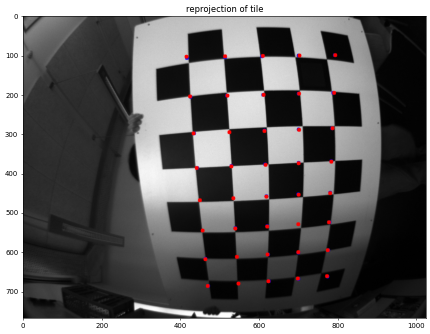

In [9]:
my_calibration_object.homography_test(objpoints, imgpoints)

# Calculate initial B = K^(-T) K^(-1)

In [10]:
my_calibration_object.load_images('test_images/*.jpg')
objpoints, imgpoints = my_calibration_object.extract_corners(False)

In [12]:

K, rvecs_, tvecs_ = my_calibration_object.initial_intrinsic_extrinsic_test(objpoints, imgpoints)
# ground_truth_K = np.array([[548.88848966, 0., 501.21329994], [0., 547.20840059, 390.6931097 ], [0., 0., 1.]])
# print(f'\nground truth K = {ground_truth_K}')
# print(f'\nDiff = {K - ground_truth_K}')
ground_K = mtx
print(f'\nground truth K = {ground_K}')
print(f'\nDiff = {K - ground_K}')

ground_rvecs = np.array(rvecs)
ground_tvecs = np.array(tvecs)

for i in range(len(rvecs_)):
    print(f'\n[image 1]---------------------------')
    print(f'\nrvec Diff = {rvecs_[i] - ground_rvecs[i]}')
    print(f'\ntvec Diff = {tvecs_[i] - ground_tvecs[i]}')

B = [ 1.26188517e-06 -8.49870531e-09  1.20556987e-06 -7.24478229e-04
 -4.77545561e-04  9.99999624e-01]

v0 = 400.18234192218534
lambda_ = 0.39100156091189087
alpha_ = 556.6463016003386
beta_ = 569.5126332808
gamma_ = 3.835626385334068

K = [[556.6463016    3.83562639 576.81893696]
 [  0.         569.51263328 400.18234192]
 [  0.           0.           1.        ]]

ground truth K = [[548.88848966   0.         501.21329994]
 [  0.         547.20840059 390.6931097 ]
 [  0.           0.           1.        ]]

Diff = [[ 7.75781194  3.83562639 75.60563703]
 [ 0.         22.3042327   9.48923222]
 [ 0.          0.          0.        ]]

[image 1]---------------------------

rvec Diff = [[-0.33617425]
 [-0.26520846]
 [-3.01682587]]

tvec Diff = [[-2.05024936]
 [ 4.39278728]
 [-8.36329448]]

[image 1]---------------------------

rvec Diff = [[-0.30405592]
 [-0.41305507]
 [-2.86117845]]

tvec Diff = [[-1.82963005]
 [ 3.11016653]
 [-9.85826901]]

[image 1]---------------------------

rvec Diff =

# Non-linear optimization

In [138]:
# param = [K (3 x 3) : camera matrix, q (1 x 6): radial distortion coefficients, R_n (n x 3 x 3) : Rodrigues rotation vecotr of n camera,
#          t_n (n x 3 x 1) : translation vector of n camera, X_ni (n x i x 3) : 3D point in world coordinates]
def params_dict(n, i, K, q, R, t, X) -> np.array :
    return dict({"n": n, "i" : i, "K" : K, "q" : q, "R" : R, "t" : t, "X" : X})


def homogeneous_to_cartesian(X : np.array) -> np.array :
    assert(len(X.shape) == 2)
    return X[:, :-1] / X[:, [-1]]

def cartesian_to_homogeneous(X : np.array) -> np.array :
    assert(len(X.shape) == 2)
    Y = np.ones(list(X.shape[:-1]) + [1], float)

    return np.append(X, Y, axis=1)

def radius(X : np.array) -> np.array :
    assert(len(X.shape) == 2)
    assert(X.shape[1] == 2)
    return np.linalg.norm(X, axis=1)

def radial_distortion_function(r : np.array, dist_coff : np.array) -> np.array :
    assert(len(dist_coff.shape) == 1)
    assert(dist_coff.shape[0] == 6)
    return (1 + dist_coff[0] * (r ** 2) + dist_coff[1] * (r ** 4) + dist_coff[2] * (r ** 6)) / \
            (1 + dist_coff[3] * (r ** 2) + dist_coff[4] * (r ** 4) + dist_coff[5] * (r ** 6))

def radial_distortion_model(param : dict) -> np.array :

    n = param['n']
    q = np.reshape(param['q'], [-1])
    K = param['K']
    i = param["i"]
    ud_points_set = np.empty((0, i, 2), float)
    for camera in range(n):
        R = param['R'][camera]
        t = param['t'][camera]
        R_matrix, _ = cv.Rodrigues(R)
        R_T = np.c_[R_matrix, t] # 3 x 4
        
        X = param["X"][camera]
        X_zero_one = np.c_[X, np.ones([i, 1], dtype=float)] # (40 x 4)
        
        camera_points = np.matmul(R_T, X_zero_one.transpose())
        # pixel_points = np.matmul(K, camera_points)
        # distorted_points = homogeneous_to_cartesian(pixel_points.transpose())

        # r = radius(distorted_points)
        # nth_image_ud_points = distorted_points * np.reshape(radial_distortion_function(r, q), [i, 1])
        # ud_points = np.append(ud_points, nth_image_ud_points.reshape(1, i, 2), axis=0)
        distorted_points = homogeneous_to_cartesian(camera_points.transpose())

        r = radius(distorted_points)
        ud_points = distorted_points * np.reshape(radial_distortion_function(r, q), [i, 1])

        homo_ud_points = cartesian_to_homogeneous(ud_points)
        pixel_ud_points = np.matmul(K, homo_ud_points.transpose())
        ud_points = homogeneous_to_cartesian(pixel_ud_points.transpose())

        ud_points_set = np.append(ud_points_set, ud_points.reshape(1, i, 2), axis=0)
    return ud_points_set

def residual(x : np.array, param : dict) -> float:
    return np.abs(x - radial_distortion_model(param))

def jacobian_u_over_w(x : np.array, param : list) -> np.array :

    pm = opencv_polynomial_model(x, k)
    em = equidistant_model(x, focal)

    row = [[2 * (p - e) * (x_ ** 3), 
    2 * (p - e) * (x_ ** 5)] for p, e, x_ in zip(pm, em, x)]

    return np.array(row)

def jacobian_u_over_w(x : np.array, param : list) -> np.array :

    pm = opencv_polynomial_model(x, k)
    em = equidistant_model(x, focal)

    row = [[2 * (p - e) * (x_ ** 3), 
    2 * (p - e) * (x_ ** 5)] for p, e, x_ in zip(pm, em, x)]

    return np.array(row)

def jacobian(x : np.array, param : list) -> np.array :

    rdm = radial_distortion_model(param)
    2 (rdm - x) * rdm / p
    row = [[2 * (p - e) * (x_ ** 3), 
    2 * (p - e) * (x_ ** 5)] for p, e, x_ in zip(pm, em, x)]

    return np.array(row)

In [124]:
X = np.array([(1,2,4), (4,8,2)])
print(X)
print("---------------")
cartesian_X = homogeneous_to_cartesian(X)
print(cartesian_X)
print("---------------")
print(radius(cartesian_X))


[[1 2 4]
 [4 8 2]]
---------------
[[0.25 0.5 ]
 [2.   4.  ]]
---------------
[0.55901699 4.47213595]


In [125]:
mtx_np = np.array(mtx)
dist_np = np.array(dist)
rvecs_np = np.array(rvecs)
tvecs_np = np.array(tvecs)

# print("mtx : ", mtx)
# print("dist : ", dist)
# print("rvecs : ", rvecs)
# print("tvecs : ", tvecs)

print("mtx shape : ", mtx_np.shape)
print("dist shape : ", dist_np.shape)
print("rvecs shape : ", rvecs_np.shape)
print("tvecs shape : ", tvecs_np.shape)


mtx shape :  (3, 3)
dist shape :  (1, 14)
rvecs shape :  (13, 3, 1)
tvecs shape :  (13, 3, 1)


In [126]:
objpoints_np = np.array(objpoints)
objpoints_np.shape

(13, 40, 3)

In [127]:
p = np.array([[2.31556927e+01, -2.56866259e+01, -5.11172497e+00,  2.36050153e+01, -1.70086701e+01, -1.64143823e+01]])
param = params_dict(13, 40, mtx_np, p, rvecs_np, tvecs_np, objpoints_np)

In [134]:
ud_points = radial_distortion_model(param)
print(ud_points.shape)

(13, 40, 2)


In [133]:
for ud_point in ud_points[0]:
    print(list(ud_point))
    print("---------")

[595.2988097476245, 130.00119748888494]
---------
[596.7074505544704, 176.86296092312696]
---------
[597.5348609169747, 229.2087040402235]
---------
[597.6080884294452, 286.59236907759873]
---------
[596.7705758452994, 348.04364187317884]
---------
[594.890354554051, 412.0422654422754]
---------
[591.9423578900696, 476.5923948530007]
---------
[588.0571950390803, 539.6180466099426]
---------
[548.0361037269058, 112.06108275474111]
---------
[547.4481674670092, 160.06682700014832]
---------
[546.4367851509518, 214.3962867935014]
---------
[544.9255796114462, 274.6634451107354]
---------
[542.8651222534106, 339.83225866691515]
---------
[540.2150250678649, 408.1793917831663]
---------
[537.0075471292881, 477.2266812416216]
---------
[533.4087185093648, 544.4305418922467]
---------
[495.70154967074285, 94.4254286397512]
---------
[492.3964956480057, 143.2919630136247]
---------
[488.8259657850332, 199.33342852396632]
---------
[485.0672648981538, 262.269500628577]
---------
[481.238055786

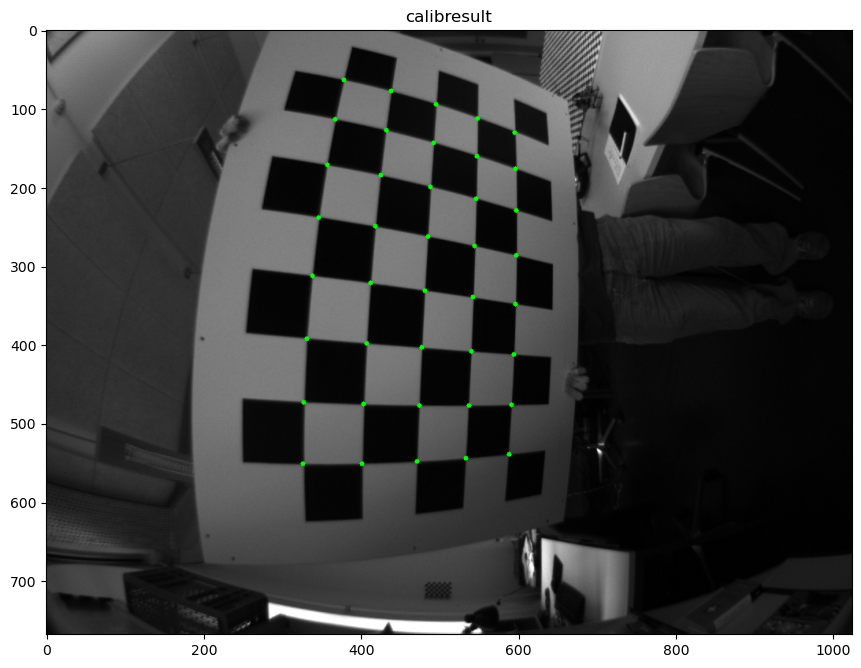

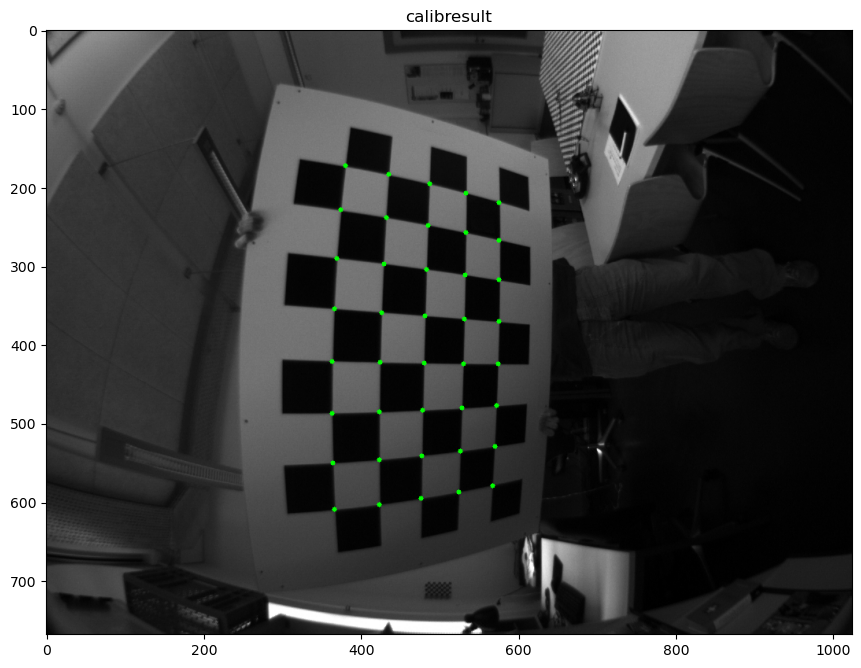

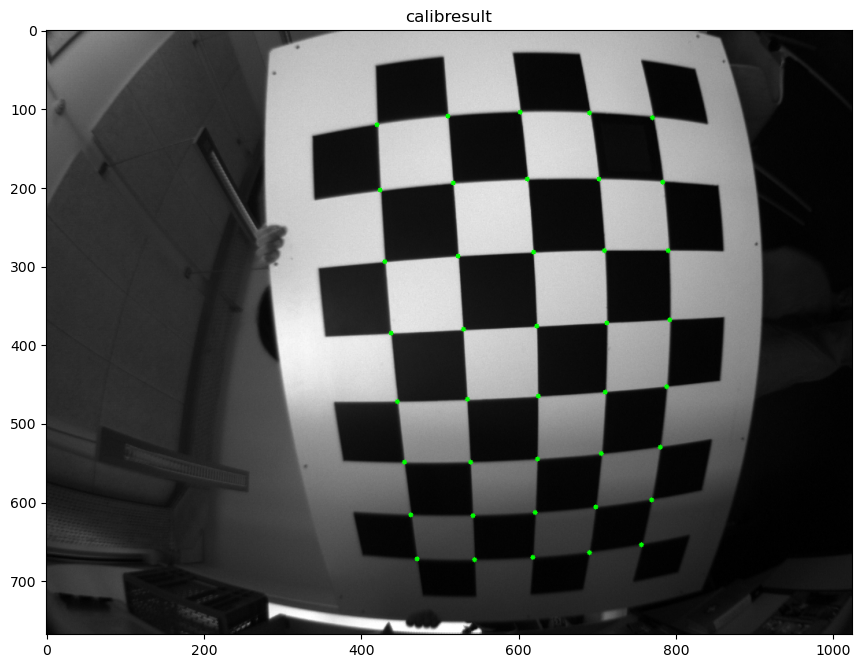

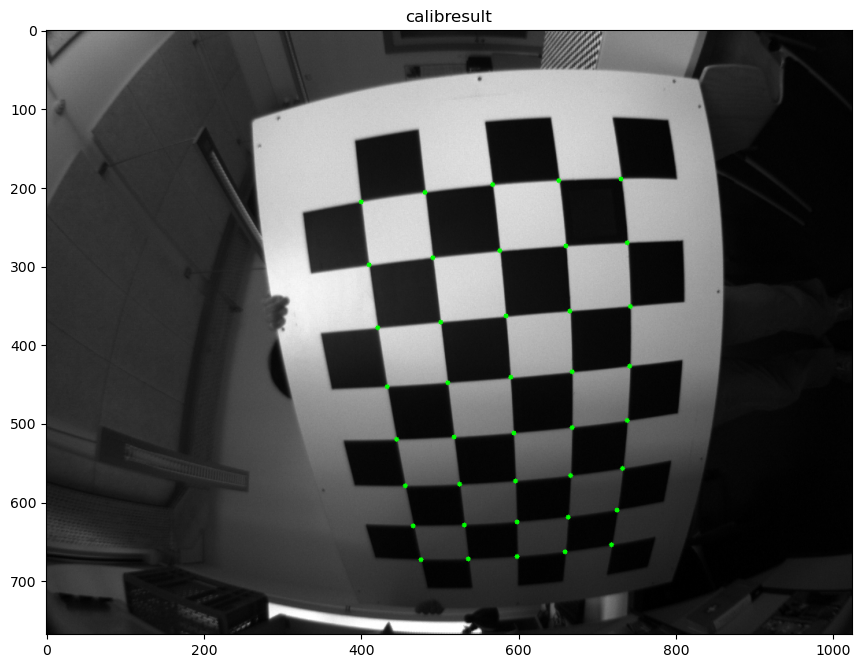

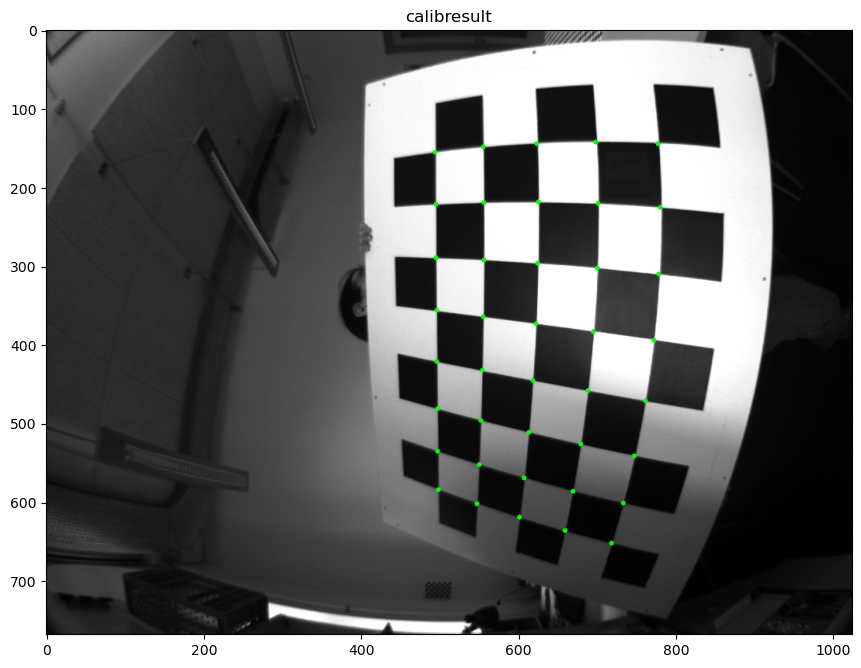

...

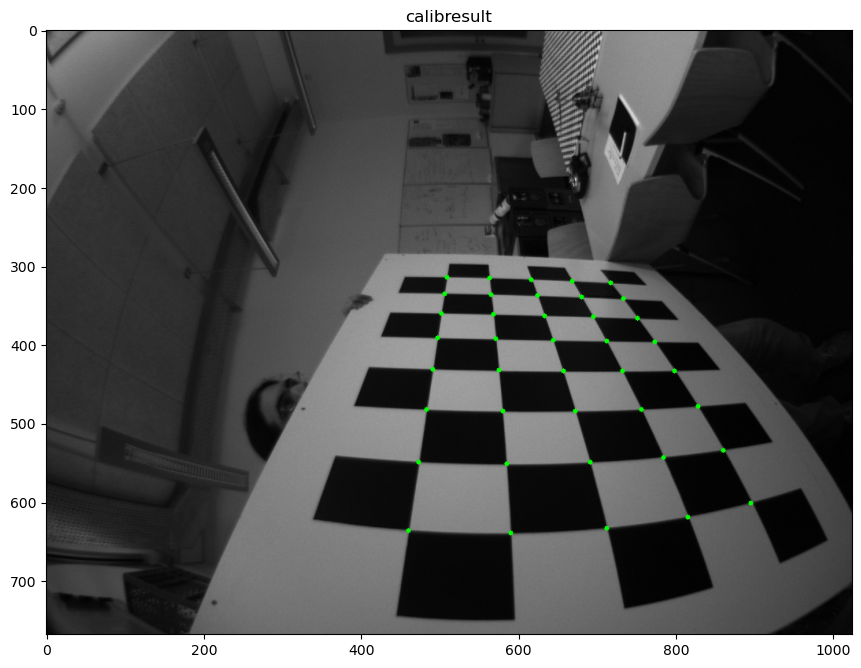

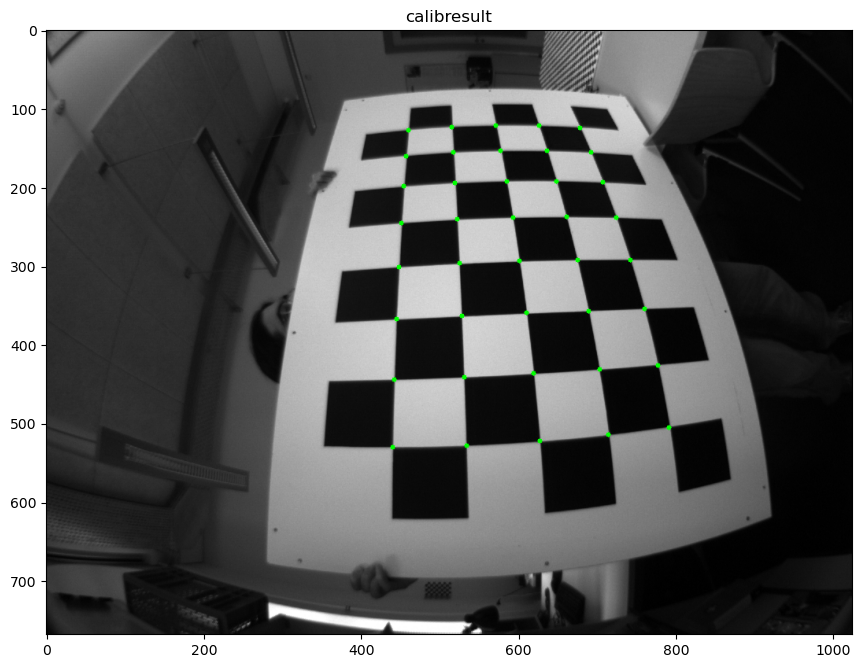

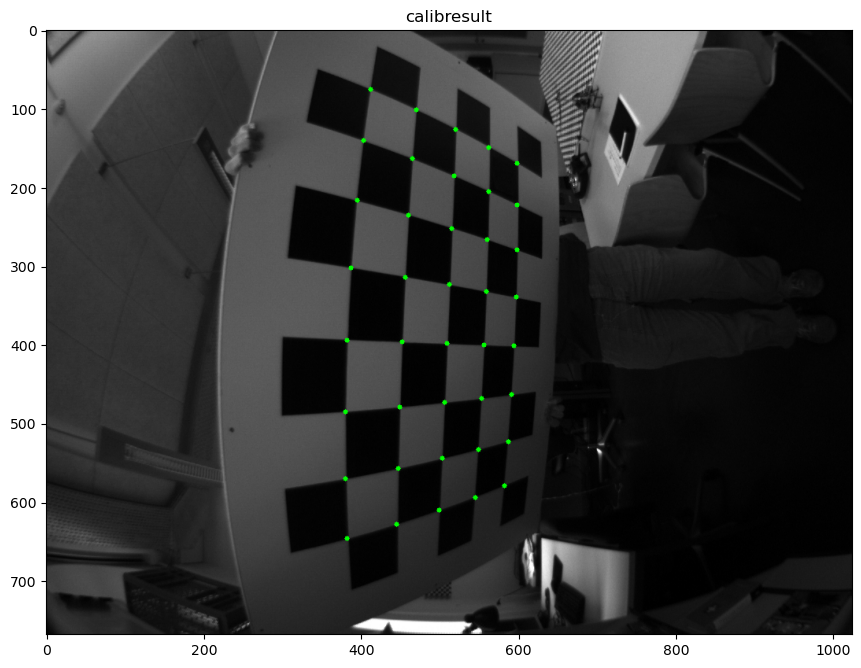

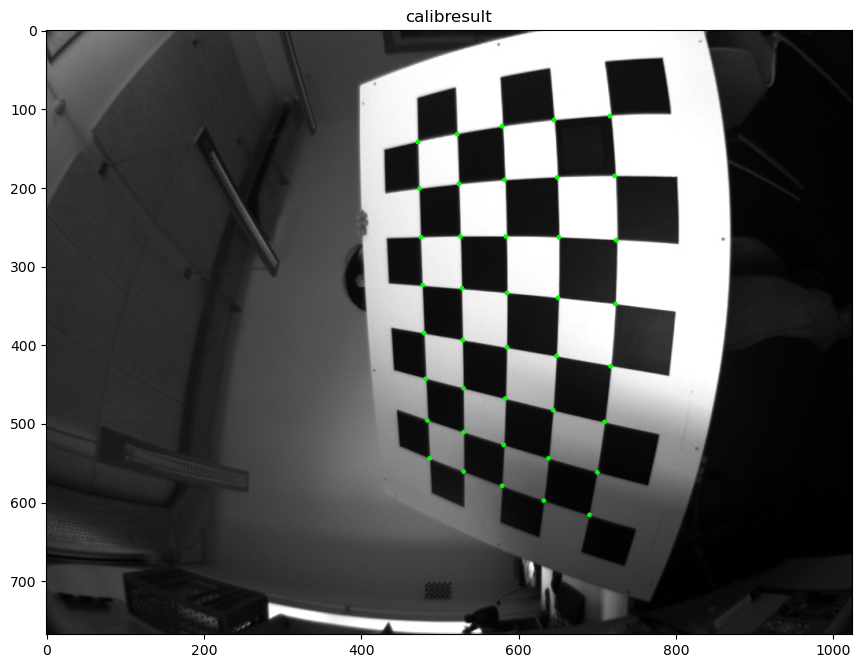

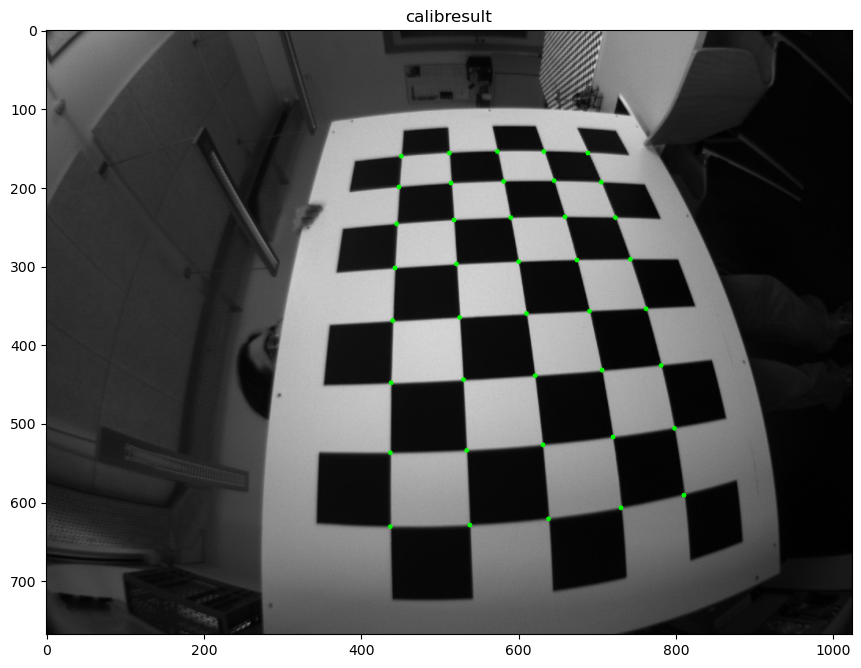

In [137]:
import random 

def random_color():
    rgbl=[255,0,0]
    random.shuffle(rgbl)
    return tuple(rgbl)

for i, img in enumerate(used_images):
    h,  w = img.shape[:2]
    newcameramtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

    # undistort
    mapx, mapy = cv.initUndistortRectifyMap(mtx, dist, None, newcameramtx, (w,h), 5)
    # dst = cv.remap(img, mapx, mapy, cv.INTER_LINEAR)
    dst = img.copy()

    # project point
    object_points = np.array([(0,0,0), (3,0,0), (0,3,0), (0,0,3)], dtype=np.float)
    image_points, jac = cv.projectPoints(object_points, rvecs[i], tvecs[i], newcameramtx, np.zeros([1, 4]))
    image_points = np.int32(image_points).reshape(-1,2)

    for ud_point in ud_points[i]:
        # rescaled_ud_point = np.matmul(newcameramtx, np.array(list(ud_points[0][0]) + [1]).reshape(3, 1))
        dst = cv.circle(dst, (int(ud_point[0]), int(ud_point[1])), 3, (0, 255, 0), -1)
    # crop the image
    x, y, w, h = roi
    #dst = dst[y:y+h, x:x+w]
    plt.title('calibresult')
    plt.imshow(cv.cvtColor(dst, cv.COLOR_BGR2RGB))
    # as opencv loads in BGR format by default, we want to show it in RGB.
    plt.show()